In [0]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
plt.style.use('ggplot')

In [24]:
df = pd.read_csv('https://github.com/ArinB/MSBA-CA-03-Decision-Trees/blob/master/census_data.csv?raw=true')
df.head()

,hours_per_week_bin,occupation_bin,msr_bin,capital_gl_bin,race_sex_bin,education_num_bin,education_bin,workclass_bin,age_bin,flag,y
0,b. 31-40,b. Mid - Low,b. Mid,c. > 0,c. High,c. 13,c. Bachelors,b. income,d. 36-40 & 56-60,train,0
1,a. 0-30,e. High,c. High,a. = 0,c. High,c. 13,c. Bachelors,b. income,e. 40-55,train,0
2,b. 31-40,a. Low,b. Mid,a. = 0,c. High,b. 9-12,b. Mid,b. income,d. 36-40 & 56-60,train,0
3,b. 31-40,a. Low,c. High,a. = 0,b. Mid,a. 0-8,a. Low,b. income,e. 40-55,train,0
4,b. 31-40,e. High,c. High,a. = 0,a. Low,c. 13,c. Bachelors,b. income,b. 26-30 & 71-100,train,0


In [25]:
#display descriptive statistics
df.describe()
df.info()

#changing target variable y to a categorical variable
df[['y']].astype('str').describe()
df.describe(exclude='int')

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 48842 entries, 0 to 48841
Data columns (total 11 columns):
hours_per_week_bin    48842 non-null object
occupation_bin        48842 non-null object
msr_bin               48842 non-null object
capital_gl_bin        48842 non-null object
race_sex_bin          48842 non-null object
education_num_bin     48842 non-null object
education_bin         48842 non-null object
workclass_bin         48842 non-null object
age_bin               48842 non-null object
flag                  48842 non-null object
y                     48842 non-null int64
dtypes: int64(1), object(10)
memory usage: 4.1+ MB


,hours_per_week_bin,occupation_bin,msr_bin,capital_gl_bin,race_sex_bin,education_num_bin,education_bin,workclass_bin,age_bin,flag
count,48842,48842,48842,48842,48842,48842,48842,48842,48842,48842
unique,5,5,3,3,3,5,5,2,5,2
top,b. 31-40,c. Mid - Mid,c. High,a. = 0,c. High,b. 9-12,b. Mid,b. income,e. 40-55,train
freq,26639,13971,22047,42525,29737,30324,30324,46012,13963,32561


# Exploratory Data Analysis 

In [0]:
def stackbar(column):
  chart = pd.pivot_table(df,values='flag',columns='y',index=column, aggfunc='count',margins=True)
  chart['group_0'] = chart.iloc[:-1,0]/chart.iloc[:-1,2]
  chart['group_1'] = chart.iloc[:-1,1]/chart.iloc[:-1,2]
  return chart.iloc[:-1,-2:]

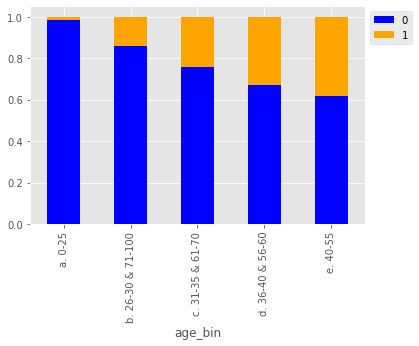

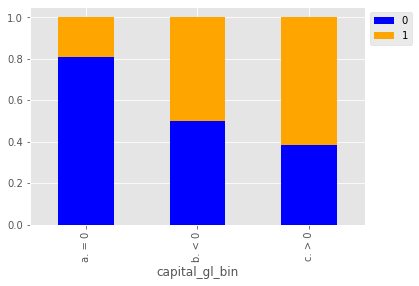

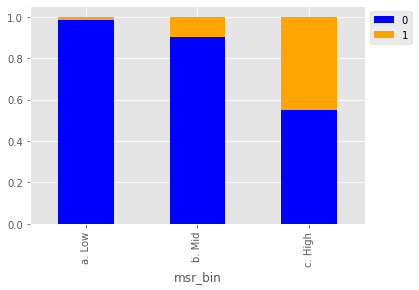

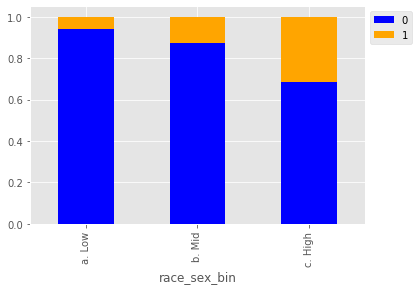

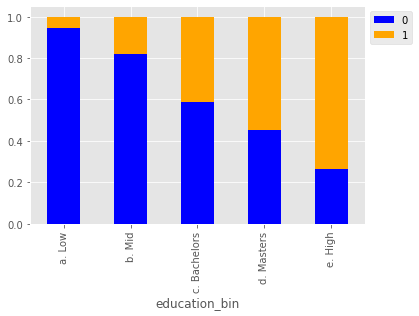

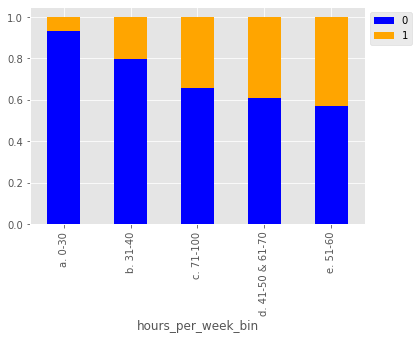

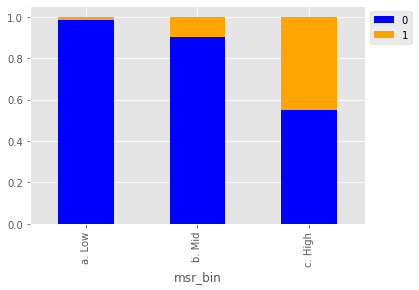

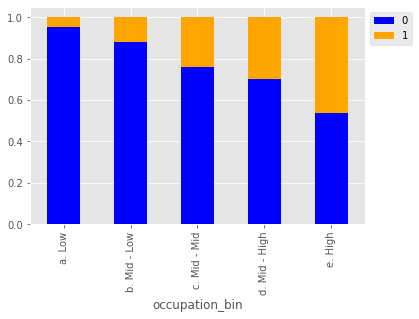

In [27]:

#plotted the stackbar with the legend 
stackbar('age_bin').plot.bar(stacked=True,color=('blue','orange')).legend(labels=(0,1),bbox_to_anchor=(1, 1))
stackbar('capital_gl_bin').plot.bar(stacked=True,color=('blue','orange')).legend(labels=(0,1),bbox_to_anchor=(1, 1))
stackbar('msr_bin').plot.bar(stacked=True,color=('blue','orange')).legend(labels=(0,1),bbox_to_anchor=(1, 1))
stackbar('race_sex_bin').plot.bar(stacked=True,color=('blue','orange')).legend(labels=(0,1),bbox_to_anchor=(1, 1))
stackbar('education_bin').plot.bar(stacked=True,color=('blue','orange')).legend(labels=(0,1),bbox_to_anchor=(1, 1))
stackbar('hours_per_week_bin').plot.bar(stacked=True,color=('blue','orange')).legend(labels=(0,1),bbox_to_anchor=(1, 1))
stackbar('msr_bin').plot.bar(stacked=True,color=('blue','orange')).legend(labels=(0,1),bbox_to_anchor=(1, 1))
stackbar('occupation_bin').plot.bar(stacked=True,color=('blue','orange')).legend(labels=(0,1),bbox_to_anchor=(1, 1))


## Build Decision Tree Classifier Models

In [0]:
from sklearn import tree

In [0]:
#splitting the training and testing data
variables = ['age_bin', 'capital_gl_bin', 'education_bin', 'hours_per_week_bin', 'msr_bin', 'occupation_bin', 'race_sex_bin']
X_train = df.loc[df['flag']=='train',variables]
y_train = df.loc[df['flag']=='train','y']
X_train = pd.get_dummies(X_train, columns=variables, drop_first=True)

X_test = df.loc[df['flag']=='test',variables]
y_test = df.loc[df['flag']=='test','y']
X_test = pd.get_dummies(X_test, columns=variables, drop_first=True)

In [30]:
#The first tree

from sklearn.tree import DecisionTreeClassifier

ginitree = DecisionTreeClassifier(max_depth=10,random_state=101,min_samples_leaf=15,min_samples_split=2)
ginitree.fit(X_train,y_train)

DecisionTreeClassifier(ccp_alpha=0.0, class_weight=None, criterion='gini',
                       max_depth=10, max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=15, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, presort='deprecated',
                       random_state=101, splitter='best')

In [0]:
ypred_gini = ginitree.predict(X_test)

#Visualize Your Decision Tree using GraphViz

In [0]:
from sklearn.tree import export_graphviz
from sklearn.externals.six import StringIO  
from IPython.display import Image  
import pydotplus

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.886673 to fit



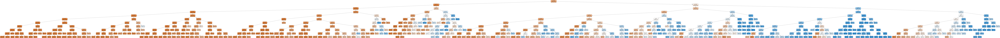

In [33]:
dot_data = StringIO()
export_graphviz(ginitree, out_file=dot_data,  
                filled=True, rounded=True,
                special_characters=True)

graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  

Image(graph.create_png())

# Evaluate Decision Tree Performance

In [0]:
from sklearn.metrics import confusion_matrix, recall_score, precision_score,accuracy_score, f1_score, roc_curve, roc_auc_score, classification_report

In [35]:
#creating the confusion matrix
confusionmatrix = confusion_matrix(y_test, ypred_gini)

confusionmatrix

array([[11521,   914],
       [ 1653,  2193]])

The format for confusion matrix is:

* [True Negative, False Positive]
* [False Negative, True Positive]

In [36]:
#Accuracy
accuracy = accuracy_score(y_test, ypred_gini)

accuracy

0.8423315521159634

In [37]:
#Recall
recall = recall_score(y_test, ypred_gini)

recall

0.5702028081123245

In [38]:
#Precision
precision = precision_score(y_test, ypred_gini)

precision

0.7058255551979401

In [39]:
#F1 
f1 = f1_score(y_test, ypred_gini)
f1

0.6308068459657701

Text(0, 0.5, 'TrP Rate')

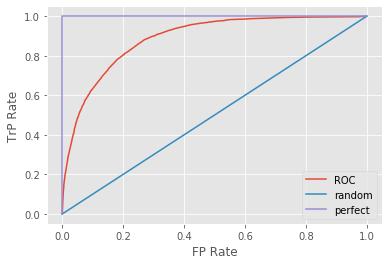

In [40]:
#ROC Curve
yscoregini = ginitree.predict_proba(X_test)[:,1]
fpr, tpr, thresholds = roc_curve(y_test,yscoregini)


import matplotlib.pyplot as plt

plt.plot(fpr, tpr,label = 'ROC')
plt.plot([0,1],[0,1],label='random')
plt.plot([0,0,1,1],[0,1,1,1],label='perfect')
plt.legend()
plt.xlabel('FP Rate')
plt.ylabel('TrP Rate')


In [41]:
#AUC
aucgini = roc_auc_score(y_test,ypred_gini)
aucgini

0.7483502983062628

# Tune Decision Tree Performance

# 1st Tree

In [42]:
#1st Tree

entropy_tree = DecisionTreeClassifier(criterion='entropy',max_depth=10,random_state=101,min_samples_leaf=15,min_samples_split=2)

entropy_tree.fit(X_train,y_train)

DecisionTreeClassifier(ccp_alpha=0.0, class_weight=None, criterion='entropy',
                       max_depth=10, max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=15, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, presort='deprecated',
                       random_state=101, splitter='best')

In [0]:
ypred_entropy = entropy_tree.predict(X_test)

In [44]:
confusionmatrix = confusion_matrix(y_test, ypred_entropy)
confusionmatrix

array([[11530,   905],
       [ 1660,  2186]])

accuracy: 0.8424543946932007
recall: 0.5683827353094124
precision: 0.707214493691362
f1: 0.6302436211618856
auc entropy: 0.7478021436900901


Text(0, 0.5, 'TP Rate')

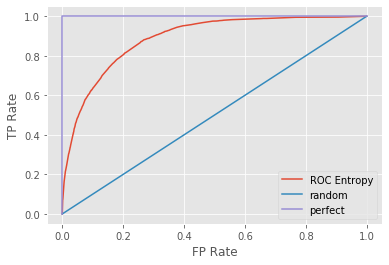

In [45]:
#Accuracy
accuracy = accuracy_score(y_test, ypred_entropy)
print('accuracy:', accuracy)

#Recall
recall = recall_score(y_test, ypred_entropy)
print('recall:',recall)

#Precision
precision = precision_score(y_test, ypred_entropy)
print('precision:',precision)

#F1 
f1 = f1_score(y_test, ypred_entropy)
print('f1:',f1)

#AUC
aucentropy = roc_auc_score(y_test,ypred_entropy)
print('auc entropy:',aucentropy)

#ROC
yscore_entropy = entropy_tree.predict_proba(X_test)[:,1]
fpr, tpr, thresholds = roc_curve(y_test,yscore_entropy)

plt.plot(fpr, tpr,label = 'ROC Entropy')
plt.plot([0,1],[0,1],label='random')
plt.plot([0,0,1,1],[0,1,1,1],label='perfect')
plt.legend()
plt.xlabel('FP Rate')
plt.ylabel('TP Rate')

# 2nd Tree

In [0]:
#2nd Tree

tree2_g = DecisionTreeClassifier(criterion='gini',max_depth=11,
                              random_state=101,min_samples_leaf=10,min_samples_split=8)
tree2_ent = DecisionTreeClassifier(criterion='entropy',max_depth=11,
                              random_state=101,min_samples_leaf=10,min_samples_split=8)

tree2_g.fit(X_train,y_train)
tree2_ent.fit(X_train,y_train)
ypred2_g = tree2_g.predict(X_test)
ypred2_ent = tree2_ent.predict(X_test)

In [47]:
#Confusion Matrix
confusionmatrix_g = confusion_matrix(y_test, ypred2_g)
confusionmatrix_e = confusion_matrix(y_test, ypred2_ent)
print('tree 2 gini:\n', confusionmatrix_g)
print('tree 2 entropy:\n', confusionmatrix_e)

tree 2 gini:
 [[11535   900]
 [ 1699  2147]]
tree 2 entropy:
 [[11542   893]
 [ 1702  2144]]


In [48]:
#only look at row for 1
print(("Gini:\n{}").format(classification_report(y_test,ypred2_g)))
print(("Entropy:\n{}").format(classification_report(y_test,ypred2_ent)))

Gini:
              precision    recall  f1-score   support

           0       0.87      0.93      0.90     12435
           1       0.70      0.56      0.62      3846

    accuracy                           0.84     16281
   macro avg       0.79      0.74      0.76     16281
weighted avg       0.83      0.84      0.83     16281

Entropy:
              precision    recall  f1-score   support

           0       0.87      0.93      0.90     12435
           1       0.71      0.56      0.62      3846

    accuracy                           0.84     16281
   macro avg       0.79      0.74      0.76     16281
weighted avg       0.83      0.84      0.83     16281



In [0]:
#ROC

#entropy
yscore2_ent = tree2_ent.predict_proba(X_test)[:,1]
fpr_2_ent, tpr_2_ent, thresholds_2_ent = roc_curve(y_test,yscore2_ent)
#gini
yscore2_g = tree2_g.predict_proba(X_test)[:,1]
fpr_2_gini, tpr_2_gini, thresholds_2_gini = roc_curve(y_test,yscore2_g)

Text(0, 0.5, 'TP Rate')

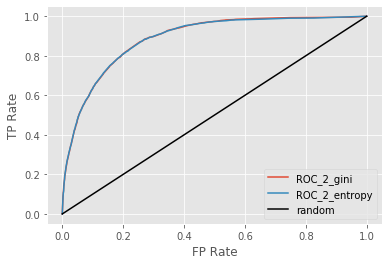

In [50]:
plt.plot(fpr_2_gini, tpr_2_gini,label = 'ROC_2_gini')
plt.plot(fpr_2_ent, tpr_2_ent,label = 'ROC_2_entropy')
plt.plot([0,1],[0,1],'k-',label='random')
plt.legend()
plt.xlabel('FP Rate')
plt.ylabel('TP Rate')

In [51]:
#AUC
auc2_gini = roc_auc_score(y_test,ypred2_g)
auc2_entropy = roc_auc_score(y_test,ypred2_ent)
print(("Gini:\n{}").format(auc2_gini))
print(("Entropy:\n{}").format(auc2_entropy))

Gini:
0.7429329863182463
Entropy:
0.7428244343283985


# 3rd Tree

In [0]:
tree3_g = DecisionTreeClassifier(criterion='gini',max_depth=20,
                              random_state=101,min_samples_leaf=10,min_samples_split=3)
tree3_ent = DecisionTreeClassifier(criterion='entropy',max_depth=20,
                              random_state=101,min_samples_leaf=10,min_samples_split=3)

In [0]:
tree3_g.fit(X_train,y_train)
tree3_ent.fit(X_train,y_train)
ypred3_g = tree3_g.predict(X_test)
ypred3_ent = tree3_ent.predict(X_test)

In [54]:
# Confusion Matrix
confusionmatrix_g = confusion_matrix(y_test, ypred3_g)
confusionmatrix_e = confusion_matrix(y_test, ypred3_ent)
print(("Confusion Matrix for 3rd tree by gini:\n{}").format(confusionmatrix_g))
print(("Confusion Matrix for 3rd tree by entropy:\n{}").format(confusionmatrix_e))

Confusion Matrix for 3rd tree by gini:
[[11510   925]
 [ 1688  2158]]
Confusion Matrix for 3rd tree by entropy:
[[11508   927]
 [ 1686  2160]]


In [55]:
# Classification report
print(("Gini:\n{}").format(classification_report(y_test,ypred3_g)))
print(("Entropy:\n{}").format(classification_report(y_test,ypred3_ent)))

Gini:
              precision    recall  f1-score   support

           0       0.87      0.93      0.90     12435
           1       0.70      0.56      0.62      3846

    accuracy                           0.84     16281
   macro avg       0.79      0.74      0.76     16281
weighted avg       0.83      0.84      0.83     16281

Entropy:
              precision    recall  f1-score   support

           0       0.87      0.93      0.90     12435
           1       0.70      0.56      0.62      3846

    accuracy                           0.84     16281
   macro avg       0.79      0.74      0.76     16281
weighted avg       0.83      0.84      0.83     16281



Text(0, 0.5, 'TP Rate')

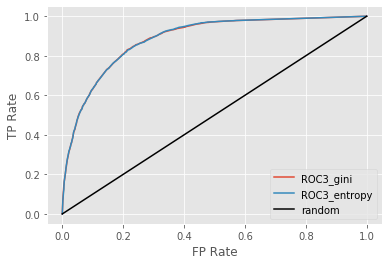

In [56]:
#ROC
yscore3_g = tree3_g.predict_proba(X_test)[:,1]
fpr_3_gini, tpr_3_gini, thresholds_3_gini = roc_curve(y_test,yscore3_g)

yscore3_ent = tree3_ent.predict_proba(X_test)[:,1]
fpr_3_entropy, tpr_3_entropy, thresholds_3_entropy = roc_curve(y_test,yscore3_ent)

plt.plot(fpr_3_gini, tpr_3_gini,label = 'ROC3_gini')
plt.plot(fpr_3_entropy, tpr_3_entropy,label = 'ROC3_entropy')
plt.plot([0,1],[0,1],'k-',label='random')
plt.legend()
plt.xlabel('FP Rate')
plt.ylabel('TP Rate')

In [57]:
#AUC
auc3_g = roc_auc_score(y_test,ypred3_g)
auc3_ent = roc_auc_score(y_test,ypred3_ent)
print(("Gini:\n{}").format(auc3_g))
print(("Entropy:\n{}").format(auc3_ent))

Gini:
0.7433578163391916
Entropy:
0.7435374085651002


# 4th Tree

In [0]:
tree4_g = DecisionTreeClassifier(criterion='gini',max_depth=9,
                              random_state=101,min_samples_leaf=12,min_samples_split=6)
tree4_ent = DecisionTreeClassifier(criterion='entropy',max_depth=9,
                              random_state=101,min_samples_leaf=12,min_samples_split=6)

tree4_g.fit(X_train,y_train)
tree4_ent.fit(X_train,y_train)
ypred4_g = tree4_g.predict(X_test)
ypred4_ent = tree4_ent.predict(X_test)

In [59]:
#Confusion Matrix

confusionmatrix_g = confusion_matrix(y_test, ypred4_g)
confusionmatrix_e = confusion_matrix(y_test, ypred4_ent)
print(("Gini:\n{}").format(confusionmatrix_g))
print(("Entropy:\n{}").format(confusionmatrix_e))

Gini:
[[11517   918]
 [ 1665  2181]]
Entropy:
[[11517   918]
 [ 1670  2176]]


In [60]:
#Classification Report
print(("4th Tree gini:\n{}").format(classification_report(y_test,ypred4_g)))
print(("4th Tree entropy:\n{}").format(classification_report(y_test,ypred4_ent)))

4th Tree gini:
              precision    recall  f1-score   support

           0       0.87      0.93      0.90     12435
           1       0.70      0.57      0.63      3846

    accuracy                           0.84     16281
   macro avg       0.79      0.75      0.76     16281
weighted avg       0.83      0.84      0.84     16281

4th Tree entropy:
              precision    recall  f1-score   support

           0       0.87      0.93      0.90     12435
           1       0.70      0.57      0.63      3846

    accuracy                           0.84     16281
   macro avg       0.79      0.75      0.76     16281
weighted avg       0.83      0.84      0.83     16281



In [0]:
#ROC
yscore4_g = tree4_g.predict_proba(X_test)[:,1]
fpr_4_gini, tpr_4_gini, thresholds_4_gini = roc_curve(y_test,yscore4_g)

yscore4_ent = tree4_ent.predict_proba(X_test)[:,1]
fpr_4_entropy, tpr_4_entropy, thresholds_4_entropy = roc_curve(y_test,yscore4_ent)


Text(0, 0.5, 'TP Rate')

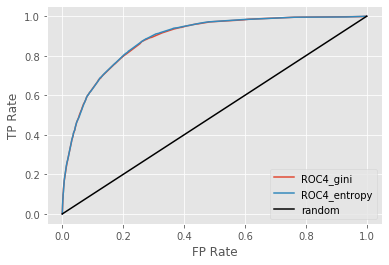

In [62]:

plt.plot(fpr_4_gini, tpr_4_gini,label = 'ROC4_gini')
plt.plot(fpr_4_entropy, tpr_4_entropy,label = 'ROC4_entropy')
plt.plot([0,1],[0,1],'k-',label='random')
plt.legend()
plt.xlabel('FP Rate')
plt.ylabel('TP Rate')

In [63]:
#AUC
auc4_g = roc_auc_score(y_test,ypred4_g)
auc4_ent = roc_auc_score(y_test,ypred4_ent)
print(("Gini:\n{}").format(auc4_g))
print(("Entropy:\n{}").format(auc4_ent))

Gini:
0.7466293995547517
Entropy:
0.7459793735537117


# Best Tree

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.969581 to fit



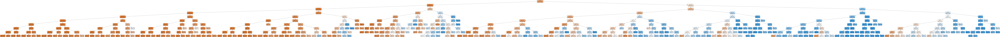

In [64]:
dot_data = StringIO()
export_graphviz(tree4_g, out_file=dot_data,  
                filled=True, rounded=True,
                special_characters=True)
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
Image(graph.create_png())

In [83]:
#runtime of best tree
%%time

tree4_g = DecisionTreeClassifier(criterion='gini',max_depth=9,
                              random_state=101,min_samples_leaf=12,min_samples_split=6)

tree4_g.fit(X_train,y_train)
ypred4_g = tree4_g.predict(X_test)

CPU times: user 36.8 ms, sys: 97 µs, total: 36.9 ms
Wall time: 40.2 ms


# Automation of Performance Tuning

In [0]:
#had a hard time automating the "Hyperparameter vs Model Performance table"

In [0]:
criterion=[]
min_samples_split=[]
min_samples_leaf=[]
max_depth=[]
accuracy=[]
precision=[]
recall=[]
f1_score=[]

In [90]:
#automating in a for loop

for temp in criterion_temp:
  for split_range in sample_split_range:
    for leaf_range in sample_leaf_range:
      for d_range in depth_range:
      
        new_class = tree.DecisionTreeClassifier(criterion=temp,min_samples_split=split_range,min_samples_leaf=leaf_range,max_depth=d_range,random_state=101)
        #fit the data
        new_class = new_class.fit(X_train, Y_train)
        y_pred = new_class.predict(X_test)

        print(("auto tree report:\n{}").format(classification_report(y_test,y_pred)))

TypeError: ignored

In [92]:

        #results
        criterion.append(temp)
        min_samples_split.append(split_range)
        min_samples_leaf.append(leaf_range)
        max_depth.append(d_range)

#making up the dataframe with a dictionary
data_dict={'criterion':criterion,'min_samples_split': min_samples_split,
           'min_samples_leaf':min_samples_leaf,'max_depth':max_depth,
           }

sample_df=pd.DataFrame(data=data_dict)
sample_df.groupby('min_samples_leaf').mean()

NameError: ignored

# Prediction using your "trained" Decision Tree Model

Based on the Performance Tuning effort in the previous section, pick your BEST PERFORMING TREE. Now make prediction of a “new” individual’s Income Category ( <=50K, or >50K ) with the following information.

• Hours Worked per Week = 48

• Occupation Category = Mid - Low

• Marriage Status & Relationships = High

• Capital Gain = Yes

• Race-Sex Group = Mid

• Number of Years of Education = 12

• Education Category = High

• Work Class = Income

• Age = 58

In [0]:
#replacing categorical values with float values
df_copy=df

new_dict={'a. 0-30':0,'b. 31-40':1,'c. 71-100':2,'d. 41-50 & 61-70':3,'e. 51-60':4,
              'a. Low':0,'b. Mid - Low':1,'c. Mid - Mid':2,'d. Mid - High':3,'e. High':4,
              'b. Mid':1, 'c. High':2,
              'a. = 0':0, 'b. < 0':1, 'c. > 0':2,
              'c. Bachelors':2, 'd. Masters':3, 'e. High':4,
              'a. 0-25':0, 'b. 26-30 & 71-100':1, 'c. 31-35 & 61-70':2,'d. 36-40 & 56-60':3,'e. 40-55':4,
}

In [106]:
df_copy=df_copy.replace(new_dict)
df_copy.describe()

,hours_per_week_bin,occupation_bin,msr_bin,capital_gl_bin,race_sex_bin,education_bin,age_bin,y
count,48842.000000,48842.000000,48842.000000,48842.000000,48842.000000,48842.000000,48842.000000,48842.000000
mean,1.488064,1.990254,1.227673,0.211949,1.554625,1.229618,2.216310,0.239282
std,1.198006,1.382509,0.789489,0.576420,0.596200,0.850605,1.487275,0.426649
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,1.000000,1.000000,1.000000,0.000000,1.000000,1.000000,1.000000,0.000000
50%,1.000000,2.000000,1.000000,0.000000,2.000000,1.000000,2.000000,0.000000
75%,3.000000,4.000000,2.000000,0.000000,2.000000,1.000000,4.000000,0.000000
max,4.000000,4.000000,2.000000,2.000000,2.000000,4.000000,4.000000,1.000000


In [0]:
from sklearn import tree

#split training and testing data
train_data=df_copy[df_copy['flag']=='train']
test_data=df_copy[df_copy['flag']=='test']

X_train = train_data[['hours_per_week_bin','occupation_bin','msr_bin','capital_gl_bin','race_sex_bin','education_bin','age_bin']]
Y_train = train_data['y']

X_test=X = test_data[['hours_per_week_bin','occupation_bin','msr_bin','capital_gl_bin','race_sex_bin','education_bin','age_bin']]
Y_test = test_data['y']

In [109]:
#My best tree is the 4th tree by using Gini index 
new_class = tree.DecisionTreeClassifier(criterion='gini',min_samples_split=6,min_samples_leaf=12,max_depth=9,random_state=101)
#fit the data
new_class = new_class.fit(X_train, Y_train)

unknown = [[1,1,3,1,2,3,4]]
y_pred=new_class.predict(unknown)

if y_pred == 0:
  print('The predicted annual income is < $50,000')
if y_pred == 1:
  print('The predicted annual income is > $50,000')
else: print('not available')

new_probability = new_class.predict_proba(unknown)

print('Probability: ', new_probability[0][y_pred])

The predicted annual income is > $50,000
Probability:  [0.68421053]
